# DWave Sampler Investigation

## Clique (Graph Theory)
- A complete graph

## DWaveCliqueSampler
- A sampler for solving clique binary quadratic models
- This sampler wraps find_clique_embedding() to generate embeddings with even chain length
  - These embeddings work well for dense binary quadratic models. For sparse models, using EmbeddingComposite with DWaveSampler is preferred.

In [1]:
import os
import json
import math
import time
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
%matplotlib inline

# DWave - Ocean SDK
import dimod
import dwave
import dwave.inspector
import networkx as nx
import dwave_networkx as dnx
from dimod import ExactSolver
from dwave.samplers import RandomSampler, SimulatedAnnealingSampler, SteepestDescentSampler, TabuSampler, TreeDecompositionSolver
from dwave.system import DWaveSampler, DWaveCliqueSampler, EmbeddingComposite, FixedEmbeddingComposite, LeapHybridSampler
from dwave.embedding import MinimizeEnergy
from minorminer import find_embedding
from minorminer.busclique import find_clique_embedding

In [2]:
folders = ["SamplerTesting", "DWaveSampler_No_Embed", "DWaveSampler_Auto_Embed", "DWaveCliqueSampler"]
folder_names = []
for i in range(len(folders)-1):
    folder_names.append( os.path.join(folders[0], folders[i+1]) )
    os.makedirs(folder_names[i], exist_ok=True)

# Load BQM

In [3]:
with open("bqm_CPU_500_3.json", "r") as f:
    data = json.load(f)
    bqm = dimod.BinaryQuadraticModel.from_serializable(data)

bqm_spin = bqm.change_vartype(dimod.SPIN, inplace=False)
bqm_binary = bqm.change_vartype(dimod.BINARY, inplace=False)

# print(f"{bqm_spin.get_linear(5)}")
# print(f"{bqm_binary.get_linear(5)}")

bqm = bqm_spin    # 改這個

# 調整線性、二次項
# for v in bqm.linear:
#     bqm.linear[v] *= 10
# for (u, v) in bqm.quadratic:
#     bqm.quadratic[(u, v)] /= 1000

# Filter out / Lift up the value below the threshold
# thresh = 1e-6
# for v in bqm.linear:
#     if abs(bqm.linear[v]) < thresh:
#         bqm.linear[v] = thresh
# for (u, v) in bqm.quadratic:
#     if abs(bqm.quadratic[(u, v)]) < thresh:
#         bqm.quadratic[(u, v)] = thresh

# 根據quad調linear
# max_abs_linear = max(abs(bias) for bias in bqm.linear.values())
# max_abs_quad = max(abs(bias) for (_, _), bias in bqm.quadratic.items())
# kkk = max_abs_linear/max_abs_quad
# multiple = np.logspace(start=0, stop=2, num=20, base=10)
# for v in bqm.linear:
#     bqm.linear[v] *= multiple[19] / kkk

# max_abs_linear = max(abs(bias) for bias in bqm.linear.values())
# max_abs_quad = max(abs(bias) for (_, _), bias in bqm.quadratic.items())
# print(max_abs_linear / max_abs_quad)
# print(max_abs_linear)

bqm_spin = bqm.change_vartype(dimod.SPIN, inplace=False)
bqm_binary = bqm.change_vartype(dimod.BINARY, inplace=False)

# print(f"{bqm_spin.get_linear(5)}")
# print(f"{bqm_binary.get_linear(5)}")

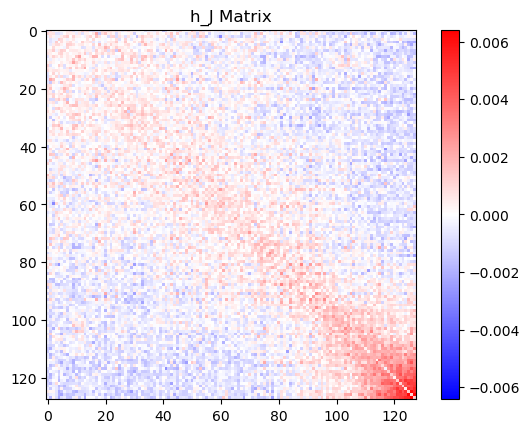

max(M): 0.006418752484023571
min(M): -0.003003924386575818
max(|M|): 0.006418752484023571
min(|M|)含0: 5.7083241244981764e-08
min(|M|)不含0: 5.7083241244981764e-08

max(linear): 0.0029663369241461623
min(linear): -0.0013346578703021805
max(|linear|): 0.0029663369241461623
min(|linear|): 5.649371814797632e-06
max(quadratic): 0.006418752484023571
min(quadratic): -0.003003924386575818
max(|quadratic|): 0.006418752484023571
min(|quadratic|): 5.7083241244981764e-08
數量級差距（整個矩陣）: 5.050942004182248
數量級差距（max(|線性項|):max(|耦合項|)）: -0.3352301512373761


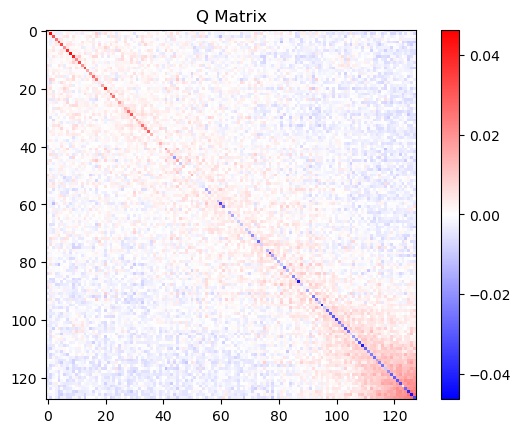

max(M): 0.04628029465675354
min(M): -0.042956914752721786
max(|M|): 0.04628029465675354
min(|M|)含0: 2.2833296497992706e-07
min(|M|)不含0: 2.2833296497992706e-07

max(linear): 0.04628029465675354
min(linear): -0.042956914752721786
max(|linear|): 0.04628029465675354
min(|linear|): 0.00028780335560441017
max(quadratic): 0.025675009936094284
min(quadratic): -0.012015697546303272
max(|quadratic|): 0.025675009936094284
min(|quadratic|): 2.2833296497992706e-07
數量級差距（整個矩陣）: 5.306827499191954
數量級差距（max(|線性項|):max(|耦合項|)）: 0.25588549500970603


In [4]:
def plot_bqm_matrix(bqm_par):
    """bqm可以是QUBO也可以是Ising"""
    
    num_variables = len(list(bqm_par.variables))
    
    M = np.zeros((num_variables, num_variables))
    
    # 讀取bqm元素到M
    for i, bias in bqm_par.linear.items():
        M[i, i] = bias
    for (i,j), bias in bqm_par.quadratic.items():
        M[i, j] = bias
        M[j, i] = bias
    
    # 畫圖
    max_abs_val = np.max(np.abs(M))
    plt.imshow(M, cmap="bwr", interpolation="nearest", vmin=-max_abs_val, vmax=max_abs_val)
    # plt.imshow(np.abs(M), cmap="jet", norm=LogNorm(), interpolation="nearest")
    plt.colorbar()
    if bqm_par.vartype == dimod.SPIN:
        plt.title("h_J Matrix")
    else:
        plt.title("Q Matrix")
    plt.show()

    # 印出極值
    print(f"max(M): {np.max(M)}")
    print(f"min(M): {np.min(M)}")
    print(f"max(|M|): {np.max(np.abs(M))}")
    print(f"min(|M|)含0: {np.min(np.abs(M))}")
    nonzero_min_abs = np.min(np.abs(M)[np.abs(M) > 0])
    print(f"min(|M|)不含0: {nonzero_min_abs}")

    # 數量級差距
    higher = math.log10(np.max(np.abs(M)))
    lower = math.log10(nonzero_min_abs)

    # linear, quadratic
    print("")
    linear_max = M[0,0]
    linear_min = M[0,0]
    linear_abs_max = np.abs(M[0,0])
    linear_abs_min = np.abs(M[0,0])
    for i in range(1, M.shape[0]):
        if M[i,i] > linear_max:
            linear_max = M[i,i]
        if M[i,i] < linear_min:
            linear_min = M[i,i]
        if np.abs(M[i,i]) > linear_abs_max:
            linear_abs_max = np.abs(M[i,i])
        if np.abs(M[i,i]) < linear_abs_min:
            linear_abs_min = np.abs(M[i,i])
    quadratic_max = M[0,1]
    quadratic_min = M[0,1]
    quadratic_abs_max = np.abs(M[0,1])
    quadratic_abs_min = np.abs(M[0,1])
    for i in range(M.shape[0]):
        for j in range(i+1, M.shape[0]):
            if M[i,j] > quadratic_max:
                quadratic_max = M[i,j]
            if M[i,j] < quadratic_min:
                quadratic_min = M[i,j]
            if np.abs(M[i,j]) > quadratic_abs_max:
                quadratic_abs_max = np.abs(M[i,j])
            if np.abs(M[i,j]) < quadratic_abs_min:
                quadratic_abs_min = np.abs(M[i,j])
    print(f"max(linear): {linear_max}")
    print(f"min(linear): {linear_min}")
    print(f"max(|linear|): {linear_abs_max}")
    print(f"min(|linear|): {linear_abs_min}")
    print(f"max(quadratic): {quadratic_max}")
    print(f"min(quadratic): {quadratic_min}")
    print(f"max(|quadratic|): {quadratic_abs_max}")
    print(f"min(|quadratic|): {quadratic_abs_min}")
    print(f"數量級差距（整個矩陣）: {higher - lower}")
    print(f"數量級差距（max(|線性項|):max(|耦合項|)）: {math.log10(linear_abs_max) - math.log10(quadratic_abs_max)}")

plot_bqm_matrix(bqm_spin)
plot_bqm_matrix(bqm_binary)

# CPU

## Exact Sampler

In [154]:
sampler_exact = ExactSolver()
sampleset_exact = sampler_exact.sample(bqm)

# Print the smallest energy
for energy in sorted(sampleset_exact.record["energy"])[:5]:
    print(f"{energy:.3f}")

ValueError: Maximum allowed dimension exceeded

## Random Sampler

In [45]:
start_time = time.time()
sampler_random = RandomSampler()
sampleset_random = sampler_random.sample(bqm, num_reads=5_000_000)
# sampleset_random = sampler_random.sample(bqm, num_reads=100_000)
end_time = time.time()
print(f"took {end_time - start_time} s")

took 39.315017223358154 s


In [46]:
# Print the smallest energy
sampleset_random_samples = sampleset_random.record["sample"]
sampleset_random_energies = sampleset_random.record["energy"]
sampleset_random_top10_idx = np.argsort(sampleset_random_energies)[:10]
sampleset_random_top10_samples = sampleset_random_samples[sampleset_random_top10_idx]
sampleset_random_top10_energies = sampleset_random_energies[sampleset_random_top10_idx]

for energy in sampleset_random_top10_energies[:5]:
    print(f"{energy:.6f}")

-0.302954
-0.297414
-0.297249
-0.296335
-0.295148


## Simulated Annealing

In [43]:
start_time = time.time()
sampler_SA = SimulatedAnnealingSampler()
sampleset_SA = sampler_SA.sample(bqm, num_reads=2_000, num_sweeps=2_000)
end_time = time.time()
print(f"took {end_time - start_time} s")

took 18.956762552261353 s


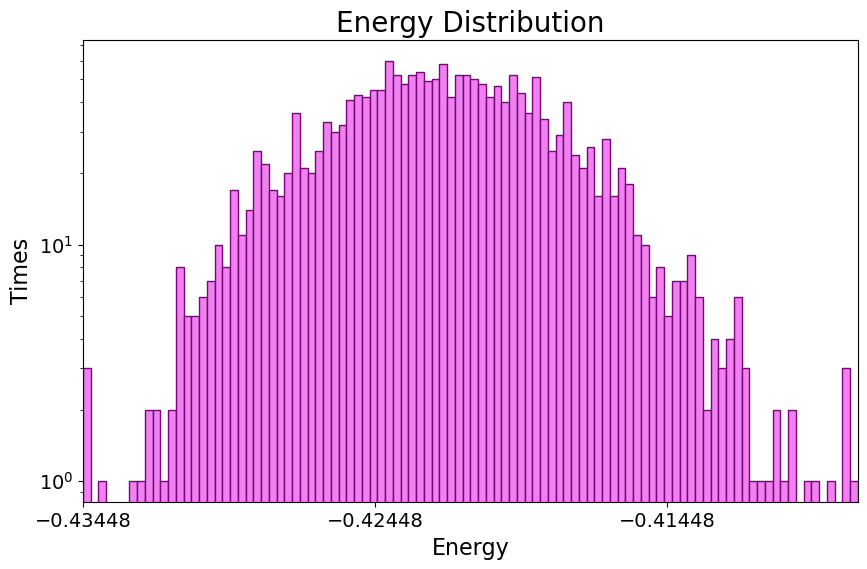

最小的energy是: -0.4344779588568599


In [44]:
all_energies = sampleset_SA.record["energy"]

# 設定參數
value_range = (np.min(all_energies), np.max(all_energies))    # 觀察foms的範圍
# value_range = (0, 350)
num_bins = 100  # 分成 100 個 bins
xtick_step = 0.01  # xticks 每隔 0.1 顯示一個值
if ((value_range[1]-value_range[0]) / xtick_step) > 50:
    print("太多個xticks")
    sys.exit(1)

# 繪製直方圖
plt.figure(figsize=(10,6))
plt.hist(all_energies, bins=num_bins, range=value_range, color="violet", edgecolor='purple')

# 設定刻度
plt.xticks(np.arange(value_range[0], value_range[1] + xtick_step, xtick_step), fontsize=14)
# plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# 
plt.title('Energy Distribution', fontsize=20)
plt.xlabel('Energy', fontsize=16)
plt.ylabel('Times', fontsize=16)
plt.yscale("log")
plt.xlim(value_range)

#
# plt.savefig(fom_dist_path, bbox_inches='tight', transparent=True)
plt.show()

print(f"最小的energy是: {np.min(all_energies)}")

In [22]:
# Print the smallest energy
sampleset_SA_samples = sampleset_SA.record["sample"]
sampleset_SA_energies = sampleset_SA.record["energy"]
sampleset_SA_top10_idx = np.argsort(sampleset_SA_energies)[:30]
sampleset_SA_top10_samples = sampleset_SA_samples[sampleset_SA_top10_idx]
sampleset_SA_top10_energies = sampleset_SA_energies[sampleset_SA_top10_idx]

for energy in sampleset_SA_top10_energies[:30]:
    print(f"{energy:.6f}")

-0.433010
-0.432928
-0.432761
-0.432656
-0.432591
-0.432441
-0.432312
-0.432256
-0.432179
-0.432179
-0.432129
-0.431980
-0.431980
-0.431947
-0.431944
-0.431894
-0.431781
-0.431594
-0.431237
-0.431218
-0.431213
-0.431208
-0.431182
-0.431148
-0.431078
-0.431036
-0.430979
-0.430918
-0.430904
-0.430864


### Simulated Annealing + Steepest Descent (Postprocessing)

In [21]:
sampler_SA_SD = SteepestDescentSampler()
sampleset_SA_SD = sampler_SA_SD.sample(bqm, initial_states=sampleset_SA, num_reads=1_000)

In [22]:
# Print the smallest energy
sampleset_SA_SD_samples = sampleset_SA_SD.record["sample"]
sampleset_SA_SD_energies = sampleset_SA_SD.record["energy"]
sampleset_SA_SD_top10_idx = np.argsort(sampleset_SA_SD_energies)[:10]
sampleset_SA_SD_top10_samples = sampleset_SA_SD_samples[sampleset_SA_SD_top10_idx]
sampleset_SA_SD_top10_energies = sampleset_SA_SD_energies[sampleset_SA_SD_top10_idx]

for energy in sampleset_SA_SD_top10_energies[:5]:
    print(f"{energy:.6f}")

-0.159814
-0.159799
-0.159795
-0.159760
-0.159750


### Simulated Annealing + Tabu (Postprocessing)

In [9]:
start_time = time.time()
sampler_SA_T = TabuSampler()
sampleset_SA_T = sampler_SA_T.sample(bqm, num_reads=1_000, initial_states=sampleset_SA)
# sampleset_SA_T = sampler_SA_T.sample(bqm, num_reads=1_000, initial_states=sampleset_SA_T)
end_time = time.time()
print(f"took {end_time - start_time} s")

took 23.1155526638031 s


In [10]:
# Print the smallest energy
sampleset_SA_T_samples = sampleset_SA_T.record["sample"]
sampleset_SA_T_energies = sampleset_SA_T.record["energy"]
sampleset_SA_T_top10_idx = np.argsort(sampleset_SA_T_energies)[:10]
sampleset_SA_T_top10_samples = sampleset_SA_T_samples[sampleset_SA_T_top10_idx]
sampleset_SA_T_top10_energies = sampleset_SA_T_energies[sampleset_SA_T_top10_idx]

for energy in sampleset_SA_T_top10_energies[:5]:
    print(f"{energy:.6f}")

-0.159818
-0.159807
-0.159804
-0.159803
-0.159760


## Steepest Descent

In [15]:
sampler_SD = SteepestDescentSampler()
sampleset_SD = sampler_SD.sample(bqm, num_reads=1_000)

In [16]:
# Print the smallest energy
sampleset_SD_samples = sampleset_SD.record["sample"]
sampleset_SD_energies = sampleset_SD.record["energy"]
sampleset_SD_top10_idx = np.argsort(sampleset_SD_energies)[:10]
sampleset_SD_top10_samples = sampleset_SD_samples[sampleset_SD_top10_idx]
sampleset_SD_top10_energies = sampleset_SD_energies[sampleset_SD_top10_idx]

for energy in sampleset_SD_top10_energies[:5]:
    print(f"{energy:.6f}")

-0.159367
-0.159362
-0.159349
-0.159245
-0.159221


## Tabu

In [17]:
start_time = time.time()
sampler_T = TabuSampler()
sampleset_T = sampler_T.sample(bqm, num_reads=1_000)
end_time = time.time()
print(f"took {end_time - start_time} s")

took 25.585885286331177 s


In [18]:
# Print the smallest energy
sampleset_T_samples = sampleset_T.record["sample"]
sampleset_T_energies = sampleset_T.record["energy"]
sampleset_T_top10_idx = np.argsort(sampleset_T_energies)[:10]
sampleset_T_top10_samples = sampleset_T_samples[sampleset_T_top10_idx]
sampleset_T_top10_energies = sampleset_T_energies[sampleset_T_top10_idx]

for energy in sampleset_T_top10_energies[:5]:
    print(f"{energy:.6f}")

-0.159715
-0.159705
-0.159703
-0.159694
-0.159690


## Tree Decomposition

In [54]:
sampler_TD = TreeDecompositionSolver()
sampleset_TD = sampler_TD.sample(bqm, num_reads=3)

ValueError: maximum treewidth of 25 exceeded. To see the bqm's treewidth:
>>> import dwave_networkx as dnx
>>> dnx.elimination_order_width(bqm.adj, [199, 198, 197, 196, 195, 194, 193, 192, 191, 190, 189, 188, 187, 186, 185, 184, 183, 182, 181, 180, 179, 178, 177, 176, 175, 174, 173, 172, 171, 170, 169, 168, 167, 166, 165, 164, 163, 162, 161, 160, 159, 158, 157, 156, 155, 154, 153, 152, 151, 150, 149, 148, 147, 146, 145, 144, 143, 142, 141, 140, 139, 138, 137, 136, 135, 134, 133, 132, 131, 130, 129, 128, 127, 58, 57, 56, 55, 54, 53, 52, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126])

# QPU

In [5]:
nums_reads = 1000

## DWaveSampler without Embedding

In [5]:
sampler_QA_no_embed = DWaveSampler(solver={"name": "Advantage_system7.1"})
sampleset_QA_no_embed = sampler_QA_no_embed.sample(bqm, num_reads=nums_reads)

In [ ]:
# Print the smallest energy
for energy in sorted(sampleset_QA_no_embed.record["energy"])[:5]:
    print(f"{energy:.3f}")

## DWaveSampler with Auto Embedding

In [ ]:
sampler_QA_auto_embed = EmbeddingComposite(DWaveSampler(solver={"name": "Advantage_system6.4"}))
sampleset_QA_auto_embed = sampler_QA_auto_embed.sample(bqm, num_reads=nums_reads)#, chain_strength=0.1110056814213749*1)

In [ ]:
# Print the smallest energy
sampleset_QA_auto_embed_samples = sampleset_QA_auto_embed.record["sample"]
sampleset_QA_auto_embed_energies = sampleset_QA_auto_embed.record["energy"]
sampleset_QA_auto_embed_top10_idx = np.argsort(sampleset_QA_auto_embed_energies)[:10]
sampleset_QA_auto_embed_top10_samples = sampleset_QA_auto_embed_samples[sampleset_QA_auto_embed_top10_idx]
sampleset_QA_auto_embed_top10_energies = sampleset_QA_auto_embed_energies[sampleset_QA_auto_embed_top10_idx]

for energy in sampleset_QA_auto_embed_top10_energies[:5]:
    print(f"{energy:.3f}")

In [ ]:
# 看鍵強
chain_strength = sampleset_QA_auto_embed.info["embedding_context"]["chain_strength"]
print(f"chain_strength_default: {chain_strength}")

In [ ]:
# 看有沒有斷鍵 (CLI)
print(sampleset_QA_auto_embed.info.keys())
print(sampleset_QA_auto_embed.info["warnings"])

In [ ]:
# 看有沒有斷鍵 (GUI)
dwave.inspector.show(sampleset_QA_auto_embed)

In [ ]:
# 看斷鍵的比例
print(sampleset_QA_auto_embed.record.dtype.names)
print(sampleset_QA_auto_embed.record["chain_break_fraction"])
print(np.min(sampleset_QA_auto_embed.record["chain_break_fraction"]))
print(np.max(sampleset_QA_auto_embed.record["chain_break_fraction"]))

## DWaveCliqueSampler

In [15]:
sampler_QA_clique_embed = DWaveCliqueSampler(solver={"name": "Advantage_system7.1"})
sampleset_QA_clique_embed = sampler_QA_clique_embed.sample(bqm, num_reads=nums_reads)#, chain_strength=1*0.07567645334347617)

In [16]:
# sampleset_QA_clique_embed = sampler_QA_clique_embed.sample(bqm, num_reads=20, return_embedding=True)
# chain_strength_default = sampleset_QA_clique_embed.info["embedding_context"]["chain_strength"]
# print(f"chain_strength_default: {chain_strength_default}")
# print("=" * 50)

# chain_strength_vec = np.arange(0.5, 1.6, 0.1)    # [0.5, 1.6)
# for chain_strength in chain_strength_vec:
    
#     sampleset_QA_clique_embed = sampler_QA_clique_embed.sample(bqm, num_reads=1, chain_strength=chain_strength_default*chain_strength, return_embedding=True)
#     print(f"chain_strength: {chain_strength}")
#     print(sorted(sampleset_QA_clique_embed.record["energy"])[:10])
    
#     sampleset_QA_clique_embed_configs_path = os.path.join(folder_names[2], f"ampstep1bqm_1000samp_configs_{chain_strength}.npy")
#     sampleset_QA_clique_embed_energies_path = os.path.join(folder_names[2], f"ampstep1bqm_1000samp_energies_{chain_strength}.npy")
#     np.save(sampleset_QA_clique_embed_configs_path, sampleset_QA_clique_embed.record["sample"])
#     np.save(sampleset_QA_clique_embed_energies_path, sampleset_QA_clique_embed.record["energy"])

#     if "message" in sampleset_QA_clique_embed.info["warnings"][-1]:
#         print(f"chain_strength: {chain_strength} ->", sampleset_QA_clique_embed.info["warnings"][-1]["message"])

#     print("=" * 50)

In [17]:
# Print the smallest energy
sampleset_QA_clique_embed_samples = sampleset_QA_clique_embed.record["sample"]
sampleset_QA_clique_embed_energies = sampleset_QA_clique_embed.record["energy"]
sampleset_QA_clique_embed_top10_idx = np.argsort(sampleset_QA_clique_embed_energies)[:10]
sampleset_QA_clique_embed_top10_samples = sampleset_QA_clique_embed_samples[sampleset_QA_clique_embed_top10_idx]
sampleset_QA_clique_embed_top10_energies = sampleset_QA_clique_embed_energies[sampleset_QA_clique_embed_top10_idx]

for energy in sampleset_QA_clique_embed_top10_energies[:5]:
    print(f"{energy:.3f}")

0.467
0.685
0.798
0.798
0.938


In [9]:
# 看有沒有斷鍵 (CLI)
print(sampleset_QA_clique_embed.info.keys())
print(sampleset_QA_clique_embed.info["warnings"])

dict_keys(['timing', 'problem_id', 'scalar', 'embedding_context', 'warnings'])
[{'type': <class 'dwave.system.warnings.ChainBreakWarning'>, 'message': 'Lowest-energy samples contain a broken chain', 'level': 40, 'data': {'target_variables': (484, 485, 486, 3782, 3783, 3784, 3785), 'source_variables': [44], 'sample_index': 0}}, {'type': <class 'dwave.system.warnings.ChainBreakWarning'>, 'message': 'Lowest-energy samples contain a broken chain', 'level': 40, 'data': {'target_variables': (499, 500, 501, 3797, 3798, 3799, 3800), 'source_variables': [45], 'sample_index': 0}}, {'type': <class 'dwave.system.warnings.ChainBreakWarning'>, 'message': 'Lowest-energy samples contain a broken chain', 'level': 40, 'data': {'target_variables': (320, 321, 3976, 3977, 3978, 3979, 3980), 'source_variables': [57], 'sample_index': 0}}, {'type': <class 'UserWarning'>, 'message': 'All samples have broken chains', 'level': 30, 'data': {}}]


In [10]:
# 看有沒有斷鍵 (GUI)
dwave.inspector.show(sampleset_QA_clique_embed)

Serving Inspector on http://127.0.0.1:18001/?problemId=58dcebd7-520e-49ad-bfd5-3480e0e025a5

'http://127.0.0.1:18001/?problemId=58dcebd7-520e-49ad-bfd5-3480e0e025a5'

In [11]:
# 看斷鍵的比例
print(sampleset_QA_clique_embed.record["chain_break_fraction"])
print(np.min(sampleset_QA_clique_embed.record["chain_break_fraction"]))
print(np.max(sampleset_QA_clique_embed.record["chain_break_fraction"]))

[0.05       0.05       0.06666667 0.03333333 0.06666667 0.06666667
 0.05       0.06666667 0.05       0.05       0.05       0.06666667
 0.06666667 0.06666667 0.06666667 0.06666667 0.08333333 0.06666667
 0.06666667 0.05       0.06666667 0.06666667 0.08333333 0.06666667
 0.08333333 0.08333333 0.06666667 0.06666667 0.05       0.08333333
 0.08333333 0.08333333 0.06666667 0.06666667 0.1        0.06666667
 0.06666667 0.06666667 0.06666667 0.06666667 0.06666667 0.06666667
 0.06666667 0.06666667 0.05       0.08333333 0.08333333 0.08333333
 0.08333333 0.05       0.06666667 0.06666667 0.08333333 0.1
 0.06666667 0.1        0.08333333 0.08333333 0.08333333 0.08333333
 0.08333333 0.06666667 0.08333333 0.08333333 0.08333333 0.1
 0.1        0.11666667 0.1        0.08333333 0.11666667 0.06666667
 0.05       0.1        0.1        0.1        0.08333333 0.08333333
 0.1        0.1        0.1        0.08333333 0.1        0.11666667
 0.08333333 0.08333333 0.1        0.1        0.1        0.11666667
 0.116666

## Manual Embedding - find_embedding()

In [10]:
source_graph = dimod.to_networkx_graph(bqm)
target_graph = DWaveSampler(solver={"name": "Advantage2_system1.1"}).to_networkx_graph()

In [11]:
import time
start_time = time.time()
embedding = minorminer.find_embedding(
    source_graph,
    target_graph,
    # chainlength_patience=1000,
    # max_fill=2,
    # tries=1000,
    # timeout=2000,
    # max_no_improvement=500,
    random_seed=42
)
end_time = time.time()
print(f"{end_time - start_time} s")

13.296247720718384 s


In [921]:
if embedding:
    with open("K64_Adv2_1.1_param1_find_embedding.json", "w", encoding="utf-8") as f:
        json.dump(embedding, f, indent=4)
else:
    print("no embedding")

In [922]:
chain_lengths = np.array([len(chain) for chain in embedding.values()])
print(f"最大鏈長: {np.max(chain_lengths)}")
print(f"平均鏈長: {np.mean(chain_lengths)}")

In [932]:
plt.figure(figsize=(50,50), dpi=100)
# dnx.draw_pegasus_yield(target_graph)
# dnx.draw_pegasus_embedding(target_graph, emb=embedding)
dnx.draw_zephyr_embedding(target_graph, emb=embedding)
plt.savefig("K64_Adv2_1.1_param1_find_embedding.png", bbox_inches='tight', transparent=True)
plt.show()

In [50]:
sampler_QA_find_embed = FixedEmbeddingComposite(DWaveSampler(solver={"name": "Advantage2_system1.1"}), embedding=embedding)
sampleset_QA_find_embed = sampler_QA_find_embed.sample(bqm, num_reads=nums_reads, chain_strength=0.1110056814213749*3.5)

In [51]:
# Print the smallest energy
sampleset_QA_find_embed_samples = sampleset_QA_find_embed.record["sample"]
sampleset_QA_find_embed_energies = sampleset_QA_find_embed.record["energy"]
sampleset_QA_find_embed_top10_idx = np.argsort(sampleset_QA_find_embed_energies)[:10]
sampleset_QA_find_embed_top10_samples = sampleset_QA_find_embed_samples[sampleset_QA_find_embed_top10_idx]
sampleset_QA_find_embed_top10_energies = sampleset_QA_find_embed_energies[sampleset_QA_find_embed_top10_idx]

for energy in sampleset_QA_find_embed_top10_energies[:5]:
    print(f"{energy:.3f}")

-0.097
-0.093
-0.078
-0.077
-0.074


In [39]:
# 看鍵強
chain_strength = sampleset_QA_find_embed.info["embedding_context"]["chain_strength"]
print(f"chain_strength_default: {chain_strength}")

chain_strength_default: 0.5550284071068745


In [40]:
# 看有沒有斷鍵 (CLI)
print(sampleset_QA_find_embed.info.keys())
print(sampleset_QA_find_embed.info["warnings"])

dict_keys(['timing', 'problem_id', 'embedding_context', 'warnings'])
[{'type': <class 'dwave.system.warnings.ChainLengthWarning'>, 'message': 'Chain length greater than 7', 'level': 30, 'data': {'target_variables': (2636, 939, 938, 937, 2632, 2635, 2634, 2633), 'source_variables': [0]}}, {'type': <class 'dwave.system.warnings.ChainLengthWarning'>, 'message': 'Chain length greater than 7', 'level': 30, 'data': {'target_variables': (1284, 1286, 1285, 1417, 2752, 2755, 2753, 2754), 'source_variables': [1]}}, {'type': <class 'dwave.system.warnings.ChainLengthWarning'>, 'message': 'Chain length greater than 7', 'level': 30, 'data': {'target_variables': (1464, 1465, 2768, 2767, 2766, 2765, 974, 973), 'source_variables': [2]}}, {'type': <class 'dwave.system.warnings.ChainLengthWarning'>, 'message': 'Chain length greater than 7', 'level': 30, 'data': {'target_variables': (1081, 2972, 1550, 1310, 1082, 2971, 2968, 2969, 2970), 'source_variables': [4]}}, {'type': <class 'dwave.system.warnings.Ch

In [31]:
# 看有沒有斷鍵 (GUI)
dwave.inspector.show(sampleset_QA_find_embed)

Serving Inspector on http://127.0.0.1:18000/?problemId=6eeb4f45-e6ea-4cd2-b9f2-6f27edb4461e

'http://127.0.0.1:18000/?problemId=6eeb4f45-e6ea-4cd2-b9f2-6f27edb4461e'

In [41]:
# 看斷鍵的比例
print(sampleset_QA_find_embed.record.dtype.names)
print(sampleset_QA_find_embed.record["chain_break_fraction"])
print(np.min(sampleset_QA_find_embed.record["chain_break_fraction"]))
print(np.max(sampleset_QA_find_embed.record["chain_break_fraction"]))

('sample', 'energy', 'num_occurrences', 'chain_break_fraction')
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

In [939]:
# chain_break_frac_mean = np.mean(sampleset_QA_find_embed.record["chain_break_fraction"])
# print(chain_break_frac_mean)

0.011111111111111112


## Manual Embedding - find_clique_embedding()

In [52]:
# source_graph = dimod.to_networkx_graph(bqm)
target_graph = DWaveSampler(solver={"name": "Advantage2_system1.1"}).to_networkx_graph()

In [53]:
num_variables = len(bqm.variables)
embedding = find_clique_embedding(
    num_variables,
    target_graph,
    seed=42
)

In [56]:
if embedding:
    with open("K64_Adv2_1.1_default_find_clique_embedding.json", "w", encoding="utf-8") as f:
        json.dump(embedding, f, indent=4)
else:
    print("no embedding")

In [57]:
chain_lengths = np.array([len(chain) for chain in embedding.values()])
print(f"最大鏈長: {np.max(chain_lengths)}")
print(f"平均鏈長: {np.mean(chain_lengths)}")

最大鏈長: 7
平均鏈長: 6.483333333333333


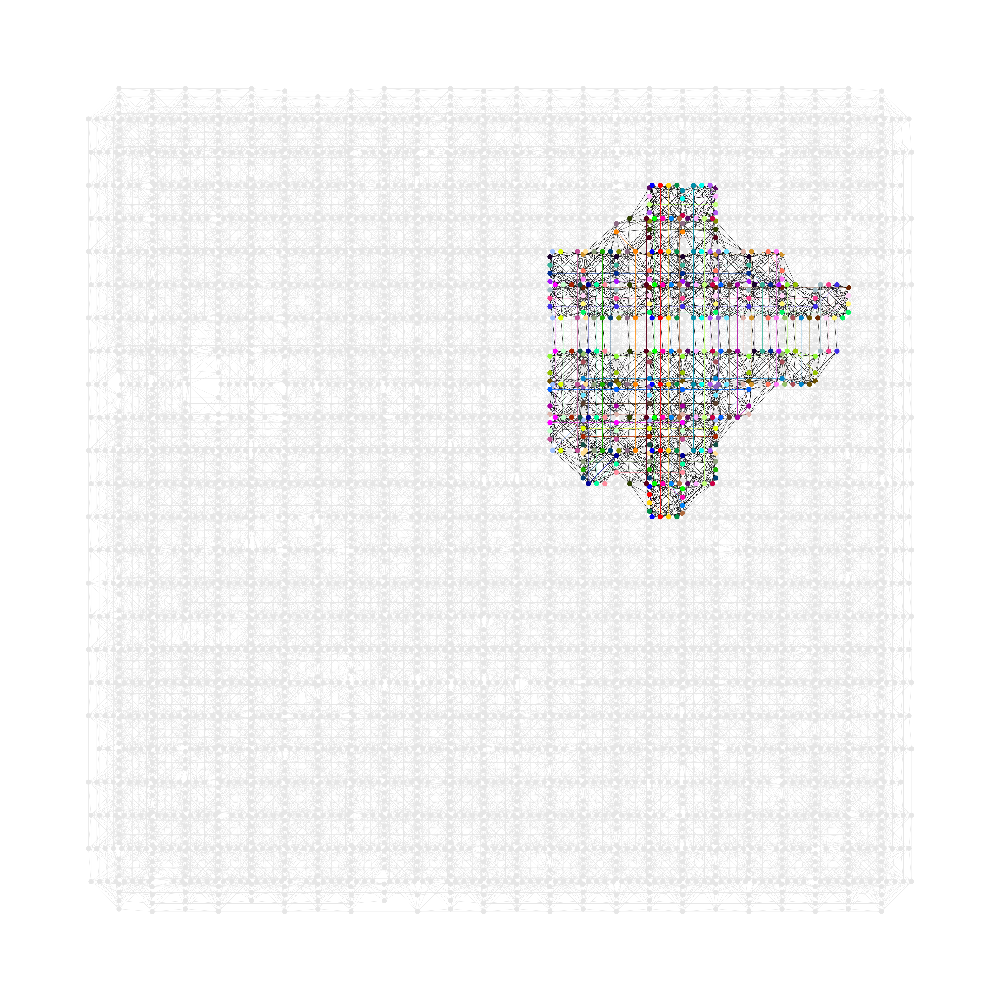

In [58]:
plt.figure(figsize=(50,50), dpi=100)
# dnx.draw_pegasus_yield(target_graph)
# dnx.draw_pegasus_embedding(target_graph, emb=embedding)
dnx.draw_zephyr_embedding(target_graph, emb=embedding)
plt.savefig("K64_Adv2_1.1_default_find_clique_embedding.png", bbox_inches='tight', transparent=True)
plt.show()

In [128]:
sampler_QA_find_clique_embed = FixedEmbeddingComposite(DWaveSampler(solver={"name": "Advantage2_system1.1"}), embedding=embedding)
sampleset_QA_find_clique_embed = sampler_QA_find_clique_embed.sample(bqm, num_reads=nums_reads, chain_strength=0.1110056814213749*4)

In [129]:
# Print the smallest energy
sampleset_QA_find_clique_embed_samples = sampleset_QA_find_clique_embed.record["sample"]
sampleset_QA_find_clique_embed_energies = sampleset_QA_find_clique_embed.record["energy"]
sampleset_QA_find_clique_embed_top10_idx = np.argsort(sampleset_QA_find_clique_embed_energies)[:10]
sampleset_QA_find_clique_embed_top10_samples = sampleset_QA_find_clique_embed_samples[sampleset_QA_find_clique_embed_top10_idx]
sampleset_QA_find_clique_embed_top10_energies = sampleset_QA_find_clique_embed_energies[sampleset_QA_find_clique_embed_top10_idx]

for energy in sampleset_QA_find_clique_embed_top10_energies[:5]:
    print(f"{energy:.3f}")

-0.091
-0.086
-0.078
-0.072
-0.071


In [117]:
# 看鍵強
chain_strength = sampleset_QA_find_clique_embed.info["embedding_context"]["chain_strength"]
print(f"chain_strength_default: {chain_strength}")

chain_strength_default: 0.4440227256854996


In [130]:
# 看有沒有斷鍵 (CLI)
print(sampleset_QA_find_clique_embed.info.keys())
print(sampleset_QA_find_clique_embed.info["warnings"])

dict_keys(['timing', 'problem_id', 'embedding_context', 'warnings'])
[]


In [63]:
# 看有沒有斷鍵 (GUI)
dwave.inspector.show(sampleset_QA_find_clique_embed)

Serving Inspector on http://127.0.0.1:18000/?problemId=0f0a3471-1de3-4770-9544-7ce1bc504a99

'http://127.0.0.1:18000/?problemId=0f0a3471-1de3-4770-9544-7ce1bc504a99'

In [131]:
# 看斷鍵的比例
print(sampleset_QA_find_clique_embed.record.dtype.names)
print(sampleset_QA_find_clique_embed.record["chain_break_fraction"])
print(np.min(sampleset_QA_find_clique_embed.record["chain_break_fraction"]))
print(np.max(sampleset_QA_find_clique_embed.record["chain_break_fraction"]))

('sample', 'energy', 'num_occurrences', 'chain_break_fraction')
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

# Hybrid

In [45]:
sampler_H = LeapHybridSampler()
min_time_H = sampler_H.min_time_limit(bqm=bqm)
print(min_time_H)

3.0


In [46]:
sampler_H = LeapHybridSampler()
sampleset_H = sampler_H.sample(bqm)

In [47]:
print(sampleset_H)

   0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 ... 127    energy num_oc.
0 +1 -1 -1 -1 -1 +1 -1 -1 -1 -1 +1 -1 -1 -1 -1 -1 +1 ...  -1 -0.434478       1
['SPIN', 1 rows, 1 samples, 128 variables]


In [48]:
sampler_H.client.close()

# 帶回原來的bqm還是低能量的解嗎

In [26]:
with open("bqm_64.json", "r") as f:
    data = json.load(f)
    bqm_test = dimod.BinaryQuadraticModel.from_serializable(data)

## Random
Random的分布

In [35]:
sampler_random_test = RandomSampler()
sampleset_random_test = sampler_random_test.sample(bqm_test, num_reads=10)

In [36]:
for energy in sampleset_random_test.record["energy"]:
    print(f"{energy:.3f}")

0.138
0.523
0.169
0.558
0.207
1.049
0.453
0.968
0.523
0.138


## SA
SA作為帶回原bqm有沒有更好的標準

In [37]:
sampler_SA_test = SimulatedAnnealingSampler()
sampleset_SA_test = sampler_SA.sample(bqm_test, num_reads=2_000, num_sweeps=1_000)

In [44]:
# Print the smallest energy
for energy in sorted(sampleset_SA_test.record["energy"])[:10]:
    print(f"{energy:.3f}")

-0.260
-0.260
-0.260
-0.260
-0.260
-0.260
-0.260
-0.260
-0.260
-0.260


## 測試Energy

In [41]:
SA_top10_energies_test = bqm_test.energies(sampleset_SA_top10_samples)
for energy in SA_top10_energies_test:
    print(f"{energy:.3f}")

5.659
5.659
5.659
5.659
5.659
5.659
5.659
5.659
5.659
5.659


In [42]:
QA_auto_embed_top10_energies_test = bqm_test.energies(sampleset_QA_auto_embed_top10_samples)
for energy in QA_auto_embed_top10_energies_test:
    print(f"{energy:.3f}")

5.659
5.659
5.659
5.636
5.636
5.700
5.247
5.247
5.316
6.120


In [43]:
QA_clique_embed_top10_energies_test = bqm_test.energies(sampleset_QA_clique_embed_top10_samples)
for energy in QA_clique_embed_top10_energies_test:
    print(f"{energy:.3f}")

5.659
5.247
5.247
5.217
5.316
5.316
5.316
5.246
5.246
5.337
